### Import required libraries


In [ ]:
import os
from google.colab import drive
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import LinearRegression, RandomForestRegressor
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import pandas as pd

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


### Define base paths


In [ ]:
BASE_PATH = "/content/drive/My Drive/Project 4"
LOAD_PATH = os.path.join(BASE_PATH, "Load Data")
PRICE_PATH = os.path.join(BASE_PATH, "price data")

### Schema definitions


In [ ]:
price_schema = StructType([
    StructField("timestamp", TimestampType(), True),
    StructField("PTID", StringType(), True),
    StructField("LBMP", DoubleType(), True),
    StructField("marginal_cost_losses", DoubleType(), True),
    StructField("marginal_cost_congestion", DoubleType(), True)
])

In [ ]:
load_schema = StructType([
    StructField("timestamp", TimestampType(), True),
    StructField("PTID", StringType(), True),
    StructField("integrated_load", DoubleType(), True)
])

###Loading Data

In [ ]:
import pandas as pd
import os
import glob

# Function to read all files from a directory structure
def read_all_files(base_path):
    all_data = []

    # Get all month folders
    month_folders = glob.glob(os.path.join(base_path, "*_csv"))

    for folder in month_folders:
        # Get all CSV files in the folder
        csv_files = glob.glob(os.path.join(folder, "*.csv"))

        for file in csv_files:
            try:
                # Read each CSV file
                df = pd.read_csv(file)
                all_data.append(df)
            except Exception as e:
                print(f"Error reading file {file}: {str(e)}")

    # Combine all data
    if all_data:
        return pd.concat(all_data, ignore_index=True)
    return None

# Read all load data
load_data = read_all_files("/content/drive/My Drive/Project 4/Load Data")
print("Load Data Shape:", load_data.shape)

# Read all price data
price_data = read_all_files("/content/drive/My Drive/Project 4/price data")
print("Price Data Shape:", price_data.shape)

# Display sample of combined data
print("\nLoad Data Sample:")
print(load_data.head())
print("\nPrice Data Sample:")
print(price_data.head())

Load Data Shape: (1164735, 5)
Price Data Shape: (1605690, 6)

Load Data Sample:
            Time Stamp Time Zone    Name   PTID    Load
0  07/01/2007 00:00:00       EDT  CAPITL  61757  1142.8
1  07/01/2007 00:00:00       EDT  CENTRL  61754  1586.8
2  07/01/2007 00:00:00       EDT  DUNWOD  61760   718.3
3  07/01/2007 00:00:00       EDT  GENESE  61753   976.3
4  07/01/2007 00:00:00       EDT  HUD VL  61758  1076.9

Price Data Sample:
            Time Stamp    Name   PTID  LBMP ($/MWHr)  \
0  04/02/2007 00:05:00  CAPITL  61757         104.71   
1  04/02/2007 00:05:00  CENTRL  61754          -2.49   
2  04/02/2007 00:05:00  DUNWOD  61760          76.15   
3  04/02/2007 00:05:00  GENESE  61753          -5.19   
4  04/02/2007 00:05:00     H Q  61844         -18.44   

   Marginal Cost Losses ($/MWHr)  Marginal Cost Congestion ($/MWHr)  
0                          -0.69                            -123.98  
1                           0.35                             -15.74  
2                

In [ ]:
import pandas as pd

# Read each dataset
load_sample = pd.read_csv("/content/drive/My Drive/Project 4/Load Data/")
price_sample = pd.read_csv("/content/drive/My Drive/Project 4/price data/")

print("Load Data Sample Columns:")
print(load_sample.columns.tolist())
print("\nFirst few rows of Load Data:")
print(load_sample.head())

print("\nPrice Data Sample Columns:")
print(price_sample.columns.tolist())
print("\nFirst few rows of Price Data:")
print(price_sample.head())

# Check timestamp format in both datasets
print("\nLoad Data Timestamp Sample:")
print(load_sample.iloc[0]['Time Stamp'] if 'Time Stamp' in load_sample.columns else "No timestamp column found")

print("\nPrice Data Timestamp Sample:")
print(price_sample.iloc[0]['Time Stamp'] if 'Time Stamp' in price_sample.columns else "No timestamp column found")

Load Data Sample Columns:
['Time Stamp', 'Time Zone', 'Name', 'PTID', 'Load']

First few rows of Load Data:
            Time Stamp Time Zone    Name   PTID    Load
0  01/01/2007 00:00:00       EST  CAPITL  61757  1145.3
1  01/01/2007 00:00:00       EST  CENTRL  61754  1647.3
2  01/01/2007 00:00:00       EST  DUNWOD  61760   612.0
3  01/01/2007 00:00:00       EST  GENESE  61753   963.3
4  01/01/2007 00:00:00       EST  HUD VL  61758  1063.5

Price Data Sample Columns:
['Time Stamp', 'Name', 'PTID', 'LBMP ($/MWHr)', 'Marginal Cost Losses ($/MWHr)', 'Marginal Cost Congestion ($/MWHr)']

First few rows of Price Data:
            Time Stamp    Name   PTID  LBMP ($/MWHr)  \
0  01/01/2007 00:05:00  CAPITL  61757          58.73   
1  01/01/2007 00:05:00  CENTRL  61754          54.09   
2  01/01/2007 00:05:00  DUNWOD  61760          60.46   
3  01/01/2007 00:05:00  GENESE  61753          51.40   
4  01/01/2007 00:05:00     H Q  61844          55.71   

   Marginal Cost Losses ($/MWHr)  Marginal

###Initialize Spark with optimized settings

In [ ]:
import os
from google.colab import drive
from pyspark.sql import SparkSession, Window
from pyspark.sql.functions import *
from pyspark.sql.types import *
from pyspark.ml.feature import VectorAssembler, StandardScaler
from pyspark.ml.regression import GBTRegressor
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.pipeline import Pipeline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Initialize Spark with optimized settings
spark = SparkSession.builder \
    .appName("NYISO_Analysis") \
    .config("spark.driver.memory", "12g") \
    .config("spark.executor.memory", "12g") \
    .config("spark.sql.shuffle.partitions", "10") \
    .config("spark.driver.maxResultSize", "8g") \
    .config("spark.sql.legacy.timeParserPolicy", "LEGACY") \
    .getOrCreate()

# Mount Google Drive
drive.mount('/content/drive')

# Define paths
BASE_PATH = "/content/drive/My Drive/Project 4"
LOAD_PATH = os.path.join(BASE_PATH, "Load Data")
PRICE_PATH = os.path.join(BASE_PATH, "price data")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Exploratory Data Analysis


In [ ]:
# 1. First, extract and prepare the data
import pyspark.sql.functions as F
from pyspark.sql.window import Window
from datetime import datetime
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import matplotlib.pyplot as plt

# Extract relevant features
df_analysis = df_with_features.select(
    "hour_timestamp",
    "PTID",
    "integrated_load",
    "LBMP",
    "marginal_cost_losses",
    "marginal_cost_congestion",
    "price_ma_24h",
    "load_ma_24h",
    F.hour("hour_timestamp").alias("hour"),
    F.month("hour_timestamp").alias("month"),
    F.dayofweek("hour_timestamp").alias("day_of_week"),
    F.dayofmonth("hour_timestamp").alias("day"),
    "is_weekend",
    "is_peak_hour"
)

# Calculate additional time-based metrics
window_spec = Window.partitionBy("PTID").orderBy("hour_timestamp")

df_analysis = df_analysis \
    .withColumn("load_change", F.col("integrated_load") - F.lag("integrated_load", 1).over(window_spec)) \
    .withColumn("price_change", F.col("LBMP") - F.lag("LBMP", 1).over(window_spec)) \
    .withColumn("hour_of_day", F.hour("hour_timestamp")) \
    .withColumn("day_name", F.date_format("hour_timestamp", "EEEE")) \
    .withColumn("week_of_year", F.weekofyear("hour_timestamp"))

# Convert to Pandas for visualization
df_pd = df_analysis.toPandas()

# Create time-based features
df_pd['date'] = pd.to_datetime(df_pd['hour_timestamp'])
df_pd['year'] = df_pd['date'].dt.year
df_pd['month'] = df_pd['date'].dt.month
df_pd['day'] = df_pd['date'].dt.day
df_pd['hour'] = df_pd['date'].dt.hour
df_pd['day_of_week'] = df_pd['date'].dt.dayofweek
df_pd['week_of_year'] = df_pd['date'].dt.isocalendar().week

# Calculate rolling statistics
df_pd['rolling_load_std'] = df_pd.groupby('PTID')['integrated_load'].transform(lambda x: x.rolling(24).std())
df_pd['rolling_price_std'] = df_pd.groupby('PTID')['LBMP'].transform(lambda x: x.rolling(24).std())
df_pd['rolling_load_mean'] = df_pd.groupby('PTID')['integrated_load'].transform(lambda x: x.rolling(24).mean())
df_pd['rolling_price_mean'] = df_pd.groupby('PTID')['LBMP'].transform(lambda x: x.rolling(24).mean())

# Calculate volatility metrics
df_pd['load_volatility'] = df_pd['rolling_load_std'] / df_pd['rolling_load_mean']
df_pd['price_volatility'] = df_pd['rolling_price_std'] / df_pd['rolling_price_mean']

# Calculate correlation metrics
df_pd['load_price_correlation'] = df_pd.groupby('PTID').apply(
    lambda x: x['integrated_load'].rolling(24).corr(x['LBMP'])
).reset_index(level=0, drop=True)

print("Data preparation completed. Shape of dataset:", df_pd.shape)
print("\nFeatures available for visualization:", df_pd.columns.tolist())



Data preparation completed. Shape of dataset: (64152, 28)

Features available for visualization: ['hour_timestamp', 'PTID', 'integrated_load', 'LBMP', 'marginal_cost_losses', 'marginal_cost_congestion', 'price_ma_24h', 'load_ma_24h', 'hour', 'month', 'day_of_week', 'day', 'is_weekend', 'is_peak_hour', 'load_change', 'price_change', 'hour_of_day', 'day_name', 'week_of_year', 'date', 'year', 'rolling_load_std', 'rolling_price_std', 'rolling_load_mean', 'rolling_price_mean', 'load_volatility', 'price_volatility', 'load_price_correlation']


<ipython-input-12-2af8a8ad28fa>:64: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_pd['load_price_correlation'] = df_pd.groupby('PTID').apply(


###Advanced Statistical Analysis

In [ ]:
# Import required libraries
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt

# Convert Spark DataFrame to Pandas for advanced visualization
df_pd = df_with_features.toPandas()

# Set basic matplotlib style
plt.style.use('default')

try:
    # 1. Interactive 3D Load-Price-Time Visualization
    fig = go.Figure(data=[go.Scatter3d(
        x=pd.to_datetime(df_pd['hour_timestamp']),
        y=df_pd['integrated_load'],
        z=df_pd['LBMP'],
        mode='markers',
        marker=dict(
            size=5,
            color=df_pd['LBMP'],
            colorscale='Viridis',
            opacity=0.8
        )
    )])
    fig.update_layout(
        title='3D Visualization of Load-Price-Time Relationship',
        scene=dict(
            xaxis_title='Time',
            yaxis_title='Load (MW)',
            zaxis_title='Price ($/MWHr)'
        )
    )
    fig.show()



except Exception as e:
    print(f"Error occurred: {str(e)}")

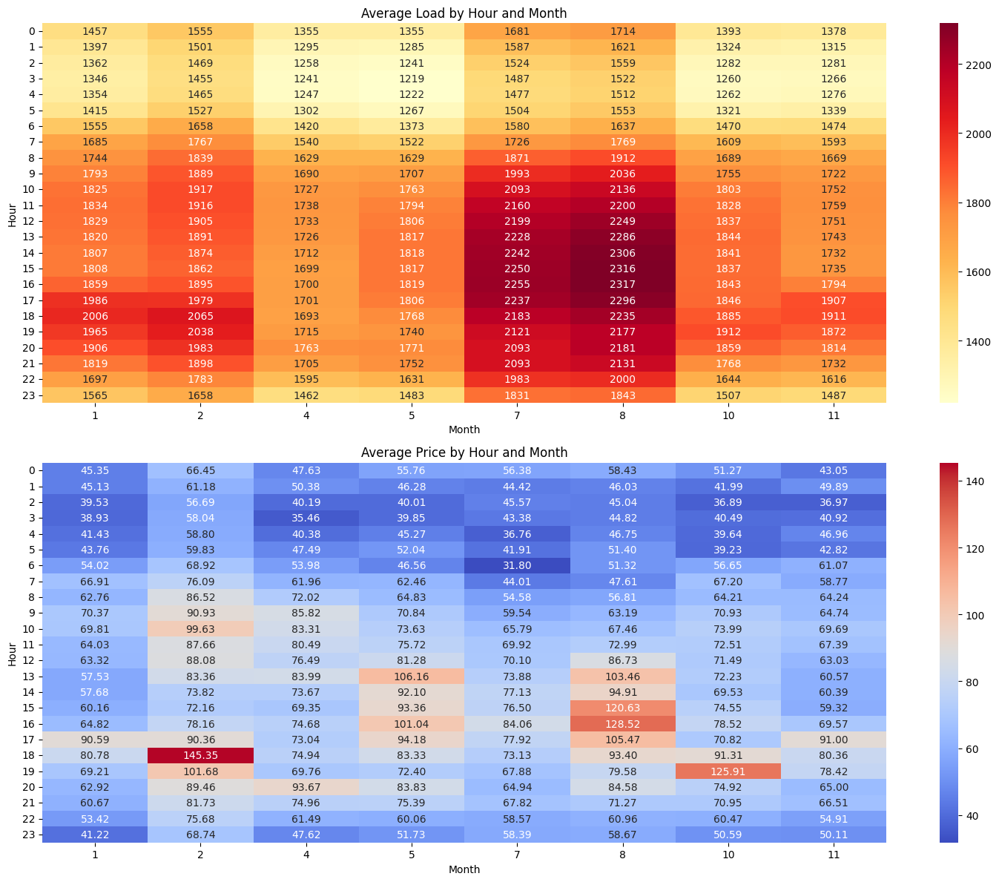

In [ ]:


# 2. Advanced Heatmap Analysis
    # Process datetime
    df_pd['hour'] = pd.to_datetime(df_pd['hour_timestamp']).dt.hour
    df_pd['month'] = pd.to_datetime(df_pd['hour_timestamp']).dt.month

    # Create figure for heatmaps
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 12))

    # Load Heatmap
    load_pivot = df_pd.pivot_table(
        values='integrated_load',
        index='hour',
        columns='month',
        aggfunc='mean'
    )

    sns.heatmap(load_pivot,
                cmap='YlOrRd',
                ax=ax1,
                annot=True,
                fmt='.0f')
    ax1.set_title('Average Load by Hour and Month')
    ax1.set_xlabel('Month')
    ax1.set_ylabel('Hour')

    # Price Heatmap
    price_pivot = df_pd.pivot_table(
        values='LBMP',
        index='hour',
        columns='month',
        aggfunc='mean'
    )

    sns.heatmap(price_pivot,
                cmap='coolwarm',
                ax=ax2,
                annot=True,
                fmt='.2f')
    ax2.set_title('Average Price by Hour and Month')
    ax2.set_xlabel('Month')
    ax2.set_ylabel('Hour')

    plt.tight_layout()
    plt.show()




In [ ]:
    # 3. Pattern Analysis with Plotly
    df_pd['day_name'] = pd.to_datetime(df_pd['hour_timestamp']).dt.day_name()

    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=(
            'Load Distribution by Day',
            'Price Distribution by Day',
            'Load-Price Correlation by Month',
            'Grid Conditions Impact'
        )
    )

    # Add traces
    fig.add_trace(
        go.Box(x=df_pd['day_name'], y=df_pd['integrated_load'], name='Load'),
        row=1, col=1
    )
    fig.add_trace(
        go.Box(x=df_pd['day_name'], y=df_pd['LBMP'], name='Price'),
        row=1, col=2
    )

    # Monthly correlation
    monthly_corr = df_pd.groupby('month').apply(
        lambda x: x['integrated_load'].corr(x['LBMP'])
    ).reset_index()
    fig.add_trace(
        go.Scatter(
            x=monthly_corr['month'],
            y=monthly_corr[0],
            mode='lines+markers',
            name='Correlation'
        ),
        row=2, col=1
    )

    # Grid conditions
    fig.add_trace(
        go.Scatter(
            x=df_pd['marginal_cost_congestion'],
            y=df_pd['LBMP'],
            mode='markers',
            marker=dict(
                color=df_pd['integrated_load'],
                colorscale='Viridis',
                showscale=True
            ),
            name='Grid Impact'
        ),
        row=2, col=2
    )

    fig.update_layout(height=800, title_text="Advanced Pattern Analysis")
    fig.show()



<ipython-input-17-2d9c32cbc051>:25: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



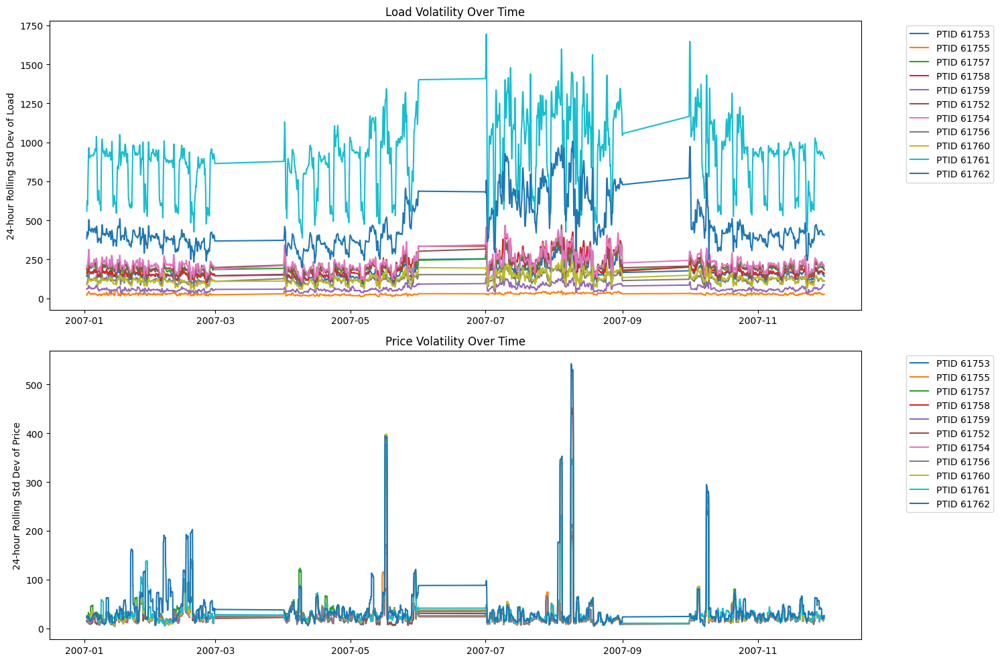

In [ ]:


    # 4. Volatility Analysis
    df_pd['rolling_std_load'] = df_pd.groupby('PTID')['integrated_load'].transform(
        lambda x: x.rolling(24).std()
    )
    df_pd['rolling_std_price'] = df_pd.groupby('PTID')['LBMP'].transform(
        lambda x: x.rolling(24).std()
    )

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10))

    # Plot load volatility
    for ptid in df_pd['PTID'].unique():
        ptid_data = df_pd[df_pd['PTID'] == ptid]
        ax1.plot(ptid_data['hour_timestamp'], ptid_data['rolling_std_load'], label=f'PTID {ptid}')
    ax1.set_title('Load Volatility Over Time')
    ax1.set_ylabel('24-hour Rolling Std Dev of Load')
    ax1.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    # Plot price volatility
    for ptid in df_pd['PTID'].unique():
        ptid_data = df_pd[df_pd['PTID'] == ptid]
        ax2.plot(ptid_data['hour_timestamp'], ptid_data['rolling_std_price'], label=f'PTID {ptid}')
    ax2.set_title('Price Volatility Over Time')
    ax2.set_ylabel('24-hour Rolling Std Dev of Price')
    ax2.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()



In [ ]:
    # 5. Market Conditions Analysis
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=df_pd['integrated_load'],
        y=df_pd['LBMP'],
        mode='markers',
        marker=dict(
            size=np.abs(df_pd['marginal_cost_congestion'])*2,
            color=df_pd['hour'],
            colorscale='Viridis',
            showscale=True,
            opacity=0.6
        ),
        text=pd.to_datetime(df_pd['hour_timestamp']).dt.strftime('%Y-%m-%d %H:00'),
        hovertemplate=
        '<b>Time</b>: %{text}'+
        '<br><b>Load</b>: %{x:.1f} MW'+
        '<br><b>Price</b>: %{y:.2f} $/MWHr'+
        '<br><b>Hour</b>: %{marker.color:.0f}'+
        '<extra></extra>'
    ))

    fig.update_layout(
        title='Market Conditions Analysis (Bubble Size = Congestion Impact)',
        xaxis_title='Load (MW)',
        yaxis_title='Price ($/MWHr)',
        showlegend=False
    )
    fig.show()

    # Print Summary Statistics
    print("\nAdvanced Statistical Summary:")
    summary_stats = df_pd.groupby('PTID').agg({
        'integrated_load': ['mean', 'std', 'min', 'max'],
        'LBMP': ['mean', 'std', 'min', 'max'],
        'marginal_cost_congestion': ['mean', 'std']
    }).round(2)
    print(summary_stats)



Advanced Statistical Summary:
      integrated_load                               LBMP                 \
                 mean      std      min       max   mean    std     min   
PTID                                                                      
61752         1848.65   263.28  1234.83   2741.31  51.81  35.45 -172.08   
61753         1157.26   209.77   727.94   2015.57  53.34  36.84 -187.43   
61754         1932.92   292.11  1305.85   2889.38  58.01  38.58 -180.68   
61755          754.82    51.57   605.17    938.33  56.80  39.14 -428.49   
61756          882.90   160.50   466.12   1349.92  59.72  40.44 -189.01   
61757         1351.18   255.54   812.05   2301.31  68.74  43.34 -162.12   
61758         1239.90   259.45   759.79   2321.98  71.73  59.95 -166.55   
61759          308.34    80.21  -107.23    611.34  72.78  67.42 -166.34   
61760          723.79   172.01   400.56   1438.82  72.98  68.21 -166.66   
61761         6239.52  1297.05  3999.23  10966.86  77.58  59.75 -155.

Found 247 price files and 243 load files


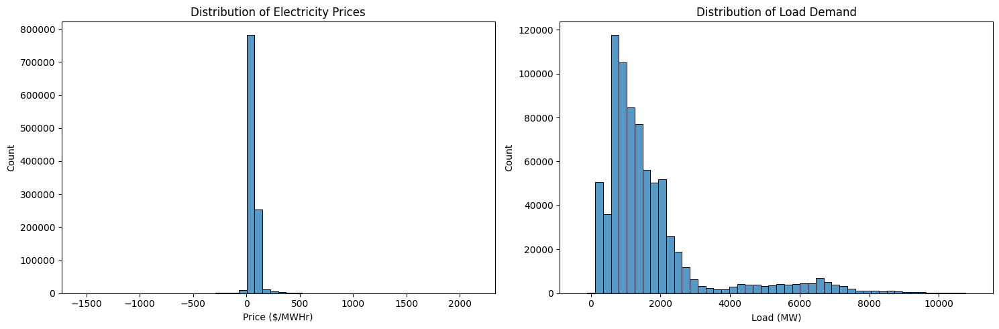


Data loaded successfully


In [ ]:
def get_csv_files(base_path):
    csv_files = []
    for root, _, files in os.walk(base_path):
        for file in files:
            if file.endswith('.csv') and not file.startswith('.'):
                try:
                    month = int(file[4:6])
                    full_path = os.path.join(root, file)
                    csv_files.append((month, full_path))
                except (ValueError, IndexError):
                    continue
    return csv_files

# Get training files
price_files = get_csv_files(PRICE_PATH)
load_files = get_csv_files(LOAD_PATH)

train_months = [m for m in range(1, 13) if m not in [3, 6, 9, 12]]
price_train_files = [path for month, path in price_files if month in train_months]
load_train_files = [path for month, path in load_files if month in train_months]

print(f"Found {len(price_train_files)} price files and {len(load_train_files)} load files")

# Load initial data
price_df = spark.read.csv(price_train_files, header=True) \
    .select(
        col("Time Stamp"),
        col("PTID"),
        col("LBMP ($/MWHr)").cast("double").alias("LBMP"),
        col("Marginal Cost Losses ($/MWHr)").cast("double").alias("marginal_cost_losses"),
        col("Marginal Cost Congestion ($/MWHr)").cast("double").alias("marginal_cost_congestion")
    )

load_df = spark.read.csv(load_train_files, header=True) \
    .select(
        col("Time Stamp"),
        col("PTID"),
        col("Load").cast("double").alias("integrated_load")
    )

# Convert to pandas for initial visualization
price_pd = price_df.select("Time Stamp", "LBMP").toPandas()
load_pd = load_df.select("Time Stamp", "integrated_load").toPandas()

# Plot 1: Price Distribution
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.histplot(data=price_pd, x="LBMP", bins=50)
plt.title("Distribution of Electricity Prices")
plt.xlabel("Price ($/MWHr)")

# Plot 2: Load Distribution
plt.subplot(1, 2, 2)
sns.histplot(data=load_pd, x="integrated_load", bins=50)
plt.title("Distribution of Load Demand")
plt.xlabel("Load (MW)")
plt.tight_layout()
plt.show()

print("\nData loaded successfully")

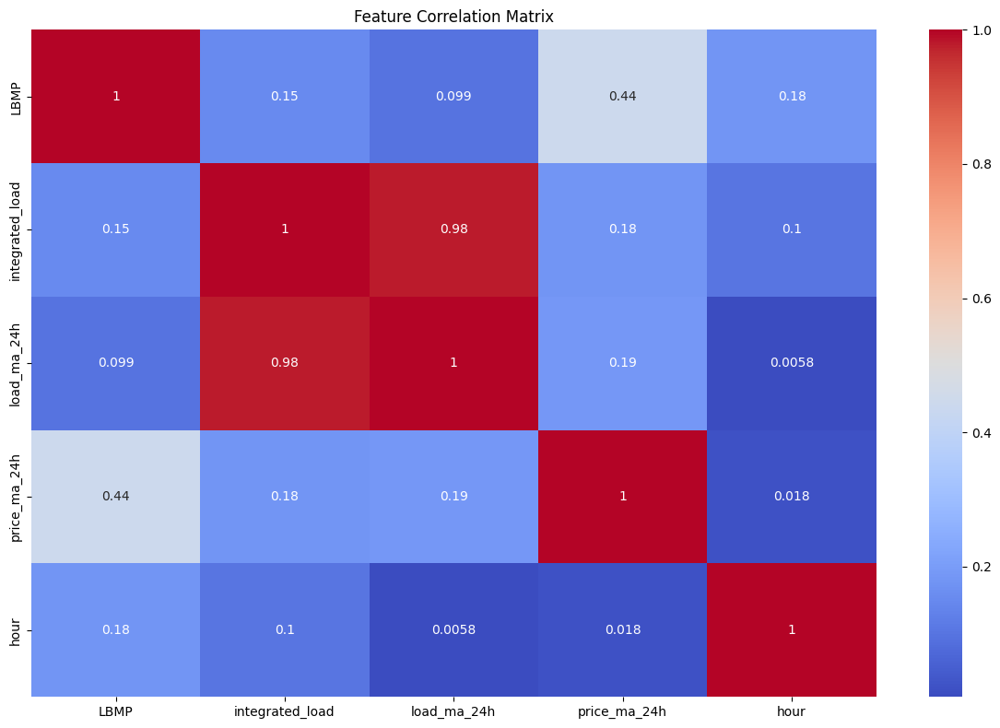

Features created successfully


In [ ]:
# Process timestamps
price_df = price_df.withColumn(
    "timestamp",
    to_timestamp("Time Stamp", "MM/dd/yyyy HH:mm:ss")
)

load_df = load_df.withColumn(
    "timestamp",
    to_timestamp("Time Stamp", "MM/dd/yyyy HH:mm:ss")
)

# Add unix timestamp for window operations
price_df = price_df.withColumn(
    "unix_timestamp",
    unix_timestamp("timestamp")
)

load_df = load_df.withColumn(
    "unix_timestamp",
    unix_timestamp("timestamp")
)

# Aggregate price data hourly
price_hourly = price_df \
    .withColumn("hour_timestamp", date_trunc("hour", col("timestamp"))) \
    .groupBy("hour_timestamp", "PTID") \
    .agg(
        avg("LBMP").alias("LBMP"),
        avg("marginal_cost_losses").alias("marginal_cost_losses"),
        avg("marginal_cost_congestion").alias("marginal_cost_congestion")
    )

# Process load data hourly
load_hourly = load_df \
    .withColumn("hour_timestamp", date_trunc("hour", col("timestamp"))) \
    .groupBy("hour_timestamp", "PTID") \
    .agg(avg("integrated_load").alias("integrated_load"))

# Join datasets
combined_df = load_hourly.join(
    price_hourly,
    ["hour_timestamp", "PTID"],
    "inner"
)

# Create time windows based on unix timestamp
window_24h = Window.partitionBy("PTID") \
    .orderBy(unix_timestamp("hour_timestamp")) \
    .rangeBetween(-86400, 0)  # 24 hours in seconds

# Enhanced feature engineering
df_with_features = combined_df \
    .withColumn("hour", hour("hour_timestamp").cast("double")) \
    .withColumn("day", dayofmonth("hour_timestamp").cast("double")) \
    .withColumn("month", month("hour_timestamp").cast("double")) \
    .withColumn("day_of_week", dayofweek("hour_timestamp").cast("double")) \
    .withColumn("is_weekend", when(dayofweek("hour_timestamp").isin([1, 7]), 1.0).otherwise(0.0)) \
    .withColumn("is_peak_hour", when((col("hour") >= 7) & (col("hour") <= 22), 1.0).otherwise(0.0)) \
    .withColumn("is_morning_peak", when((col("hour") >= 7) & (col("hour") <= 9), 1.0).otherwise(0.0)) \
    .withColumn("is_evening_peak", when((col("hour") >= 17) & (col("hour") <= 20), 1.0).otherwise(0.0)) \
    .withColumn("load_ma_24h", avg("integrated_load").over(window_24h)) \
    .withColumn("load_std_24h", stddev("integrated_load").over(window_24h)) \
    .withColumn("price_ma_24h", avg("LBMP").over(window_24h)) \
    .withColumn("price_std_24h", stddev("LBMP").over(window_24h)) \
    .withColumn("hour_sin", sin(2 * 3.14159 * col("hour") / 24)) \
    .withColumn("hour_cos", cos(2 * 3.14159 * col("hour") / 24)) \
    .withColumn("month_sin", sin(2 * 3.14159 * col("month") / 12)) \
    .withColumn("month_cos", cos(2 * 3.14159 * col("month") / 12))

# Convert to pandas for feature analysis
feature_pd = df_with_features.toPandas()

# Plot correlation matrix
plt.figure(figsize=(12, 8))
correlation_matrix = feature_pd[['LBMP', 'integrated_load', 'load_ma_24h', 'price_ma_24h', 'hour']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Feature Correlation Matrix")
plt.tight_layout()
plt.show()

print("Features created successfully")

###1st Question

In [ ]:
# Define features
feature_cols = [
    "integrated_load", "hour", "day", "month", "day_of_week",
    "is_weekend", "is_peak_hour", "load_ma_24h", "load_std_24h",
    "price_ma_24h", "price_std_24h", "hour_sin", "hour_cos",
    "month_sin", "month_cos", "marginal_cost_losses", "marginal_cost_congestion"
]

# Create pipeline stages
assembler = VectorAssembler(
    inputCols=feature_cols,
    outputCol="features",
    handleInvalid="skip"
)

scaler = StandardScaler(
    inputCol="features",
    outputCol="scaled_features",
    withStd=True,
    withMean=True
)

gbt = GBTRegressor(
    featuresCol="scaled_features",
    labelCol="LBMP",
    maxIter=50,
    maxDepth=8,
    stepSize=0.1,
    minInstancesPerNode=5
)

# Create pipeline
pipeline = Pipeline(stages=[assembler, scaler, gbt])

# Split data chronologically
df_with_features = df_with_features.orderBy("hour_timestamp")
train_data, test_data = df_with_features.randomSplit([0.8, 0.2], seed=42)

# Train model
print("Training model...")
model = pipeline.fit(train_data)

Training model...



Model Performance Metrics:
RMSE: 18.34
R2 Score: 0.87
MAE: 9.00
MAPE: 38.95%


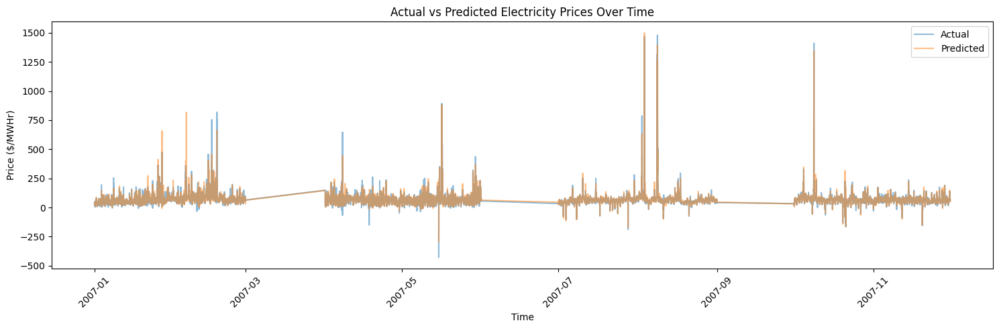

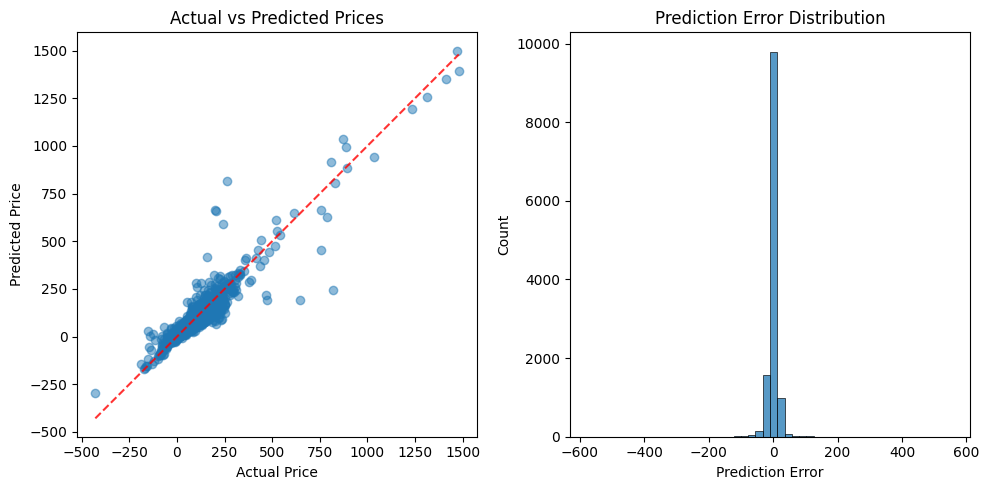

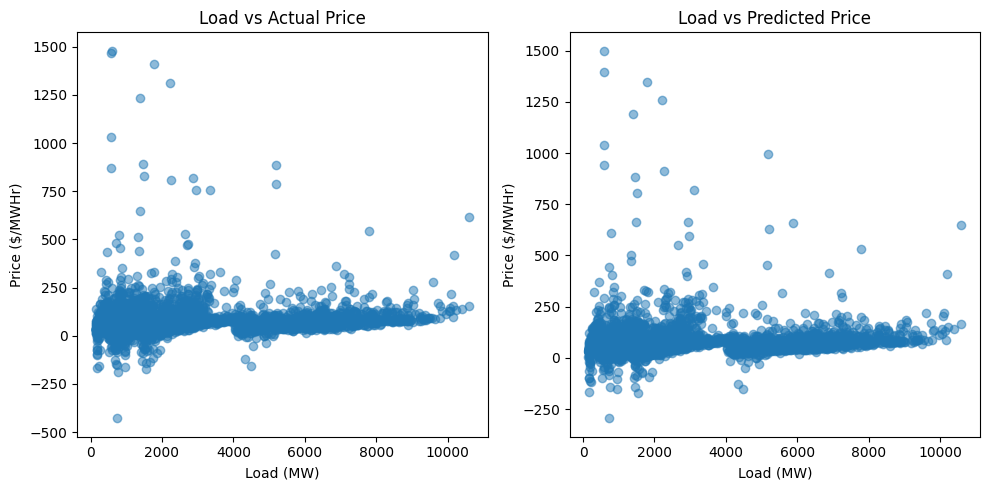

In [ ]:
# Make predictions
predictions = model.transform(test_data)

# Convert to pandas for detailed analysis
pred_pd = predictions.select("hour_timestamp", "LBMP", "prediction", "integrated_load").toPandas()

# Calculate metrics
rmse = np.sqrt(mean_squared_error(pred_pd["LBMP"], pred_pd["prediction"]))
r2 = r2_score(pred_pd["LBMP"], pred_pd["prediction"])
mae = mean_absolute_error(pred_pd["LBMP"], pred_pd["prediction"])
mape = np.mean(np.abs((pred_pd["LBMP"] - pred_pd["prediction"]) / pred_pd["LBMP"])) * 100

print("\nModel Performance Metrics:")
print(f"RMSE: {rmse:.2f}")
print(f"R2 Score: {r2:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")

# Visualization 1: Time Series Plot
plt.figure(figsize=(15, 5))
plt.plot(pred_pd["hour_timestamp"], pred_pd["LBMP"], label="Actual", alpha=0.5)
plt.plot(pred_pd["hour_timestamp"], pred_pd["prediction"], label="Predicted", alpha=0.5)
plt.title("Actual vs Predicted Electricity Prices Over Time")
plt.xlabel("Time")
plt.ylabel("Price ($/MWHr)")
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Visualization 2: Scatter Plot
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(pred_pd["LBMP"], pred_pd["prediction"], alpha=0.5)
plt.plot([pred_pd["LBMP"].min(), pred_pd["LBMP"].max()],
         [pred_pd["LBMP"].min(), pred_pd["LBMP"].max()],
         'r--', alpha=0.8)
plt.title("Actual vs Predicted Prices")
plt.xlabel("Actual Price")
plt.ylabel("Predicted Price")

# Visualization 3: Error Distribution
plt.subplot(1, 2, 2)
errors = pred_pd["prediction"] - pred_pd["LBMP"]
sns.histplot(errors, bins=50)
plt.title("Prediction Error Distribution")
plt.xlabel("Prediction Error")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# Visualization 4: Price vs Load
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.scatter(pred_pd["integrated_load"], pred_pd["LBMP"], alpha=0.5, label="Actual")
plt.title("Load vs Actual Price")
plt.xlabel("Load (MW)")
plt.ylabel("Price ($/MWHr)")

plt.subplot(1, 2, 2)
plt.scatter(pred_pd["integrated_load"], pred_pd["prediction"], alpha=0.5, label="Predicted")
plt.title("Load vs Predicted Price")
plt.xlabel("Load (MW)")
plt.ylabel("Price ($/MWHr)")
plt.tight_layout()
plt.show()

#### Modified feature engineering with more sophisticated features


In [ ]:
def create_enhanced_features(df):
    # Base time windows
    windows = {
        "1h": 3600,
        "3h": 10800,
        "6h": 21600,
        "12h": 43200,
        "24h": 86400
    }

    # Add unix timestamp for window operations
    df = df.withColumn("unix_timestamp", unix_timestamp("hour_timestamp"))

    # Create window specs
    window_specs = {
        name: Window.partitionBy("PTID") \
                    .orderBy("unix_timestamp") \
                    .rangeBetween(-seconds, 0)
        for name, seconds in windows.items()
    }

    # Basic time features
    df = df.withColumn("hour", hour("hour_timestamp").cast("double")) \
           .withColumn("day", dayofmonth("hour_timestamp").cast("double")) \
           .withColumn("month", month("hour_timestamp").cast("double")) \
           .withColumn("day_of_week", dayofweek("hour_timestamp").cast("double")) \
           .withColumn("is_weekend", when(dayofweek("hour_timestamp").isin([1, 7]), 1.0).otherwise(0.0))
     # Add the new improvements here
    # 1. Handle negative prices
    df = df.withColumn("transformed_price",
        when(col("LBMP") < 0, 0).otherwise(col("LBMP"))) \
        .withColumn("is_negative_price",
            when(col("LBMP") < 0, 1.0).otherwise(0.0))

    # 2. Better peak transition handling
    df = df.withColumn("is_morning_transition",
        when((col("hour") >= 5) & (col("hour") <= 8), 1.0).otherwise(0.0)) \
        .withColumn("is_evening_transition",
            when((col("hour") >= 16) & (col("hour") <= 19), 1.0).otherwise(0.0))

    # 3. Spike detection features
    window_1h = Window.partitionBy("PTID").orderBy("unix_timestamp").rangeBetween(-3600, 0)
    df = df.withColumn("price_volatility_1h",
            stddev("LBMP").over(window_1h) / avg("LBMP").over(window_1h)) \
        .withColumn("is_price_spike",
            when(col("LBMP") > col("price_ma_24h") * 2, 1.0).otherwise(0.0))

    # Enhanced time features
    df = df.withColumn("is_morning_peak", when((col("hour") >= 7) & (col("hour") <= 9), 1.0).otherwise(0.0)) \
           .withColumn("is_evening_peak", when((col("hour") >= 17) & (col("hour") <= 20), 1.0).otherwise(0.0)) \
           .withColumn("is_business_hour", when((col("hour") >= 9) & (col("hour") <= 17), 1.0).otherwise(0.0)) \
           .withColumn("hour_sin", sin(2 * 3.14159 * col("hour") / 24)) \
           .withColumn("hour_cos", cos(2 * 3.14159 * col("hour") / 24)) \
           .withColumn("month_sin", sin(2 * 3.14159 * col("month") / 12)) \
           .withColumn("month_cos", cos(2 * 3.14159 * col("month") / 12))

    # Load features for each window
    for window_name, window_spec in window_specs.items():
        df = df \
            .withColumn(f"load_ma_{window_name}", avg("integrated_load").over(window_spec)) \
            .withColumn(f"load_std_{window_name}", stddev("integrated_load").over(window_spec)) \
            .withColumn(f"load_max_{window_name}", max("integrated_load").over(window_spec)) \
            .withColumn(f"load_min_{window_name}", min("integrated_load").over(window_spec))

    # Price features for each window
    for window_name, window_spec in window_specs.items():
        df = df \
            .withColumn(f"price_ma_{window_name}", avg("LBMP").over(window_spec)) \
            .withColumn(f"price_std_{window_name}", stddev("LBMP").over(window_spec)) \
            .withColumn(f"price_max_{window_name}", max("LBMP").over(window_spec)) \
            .withColumn(f"price_min_{window_name}", min("LBMP").over(window_spec))

    # Load ratios and changes
    df = df.withColumn("load_ratio_24h", col("integrated_load") / col("load_ma_24h")) \
           .withColumn("load_ratio_1h", col("integrated_load") / col("load_ma_1h")) \
           .withColumn("price_ratio_24h", col("LBMP") / col("price_ma_24h"))

    return df.drop("unix_timestamp")

In [ ]:
from pyspark.ml.regression import GBTRegressor, RandomForestRegressor
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

def train_specialized_models(df):
    """Train separate models for different scenarios"""
    # Split data by peak/off-peak
    peak_data = df.filter(col("is_peak_hour") == 1.0)
    off_peak_data = df.filter(col("is_peak_hour") == 0.0)

    # Define features
    base_features = [
        "integrated_load", "hour", "day", "month", "day_of_week",
        "is_weekend", "is_morning_peak", "is_evening_peak", "is_business_hour",
        "hour_sin", "hour_cos", "month_sin", "month_cos",
        # Add new features here
        "is_negative_price", "is_morning_transition", "is_evening_transition",
        "price_volatility_1h", "is_price_spike"
    ]

    load_features = [col for col in df.columns if col.startswith("load_")]
    price_features = [col for col in df.columns if col.startswith("price_")]

    all_features = base_features + load_features + price_features

    # Create pipeline stages
    assembler = VectorAssembler(inputCols=all_features, outputCol="features", handleInvalid="skip")
    scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withStd=True, withMean=True)

    # GBT parameters
    gbt = GBTRegressor(
        featuresCol="scaled_features",
        labelCol="LBMP",
        maxIter=100,
        maxDepth=8,
        stepSize=0.1
    )

    # Create pipelines
    pipeline = Pipeline(stages=[assembler, scaler, gbt])

    # Train models
    print("Training peak hours model...")
    peak_model = pipeline.fit(peak_data)

    print("Training off-peak hours model...")
    off_peak_model = pipeline.fit(off_peak_data)

    return peak_model, off_peak_model

def predict_with_specialized_models(peak_model, off_peak_model, test_data):
    """Make predictions using specialized models"""
    # Split test data
    peak_test = test_data.filter(col("is_peak_hour") == 1.0)
    off_peak_test = test_data.filter(col("is_peak_hour") == 0.0)

    # Make predictions
    peak_predictions = peak_model.transform(peak_test)
    off_peak_predictions = off_peak_model.transform(off_peak_test)

    # Combine predictions
    all_predictions = peak_predictions.union(off_peak_predictions)

    return all_predictions

Training peak hours model...
Training off-peak hours model...

Enhanced Model Performance:
RMSE: 18.37
R2 Score: 0.92
MAE: 3.22
MAPE: 6.85%


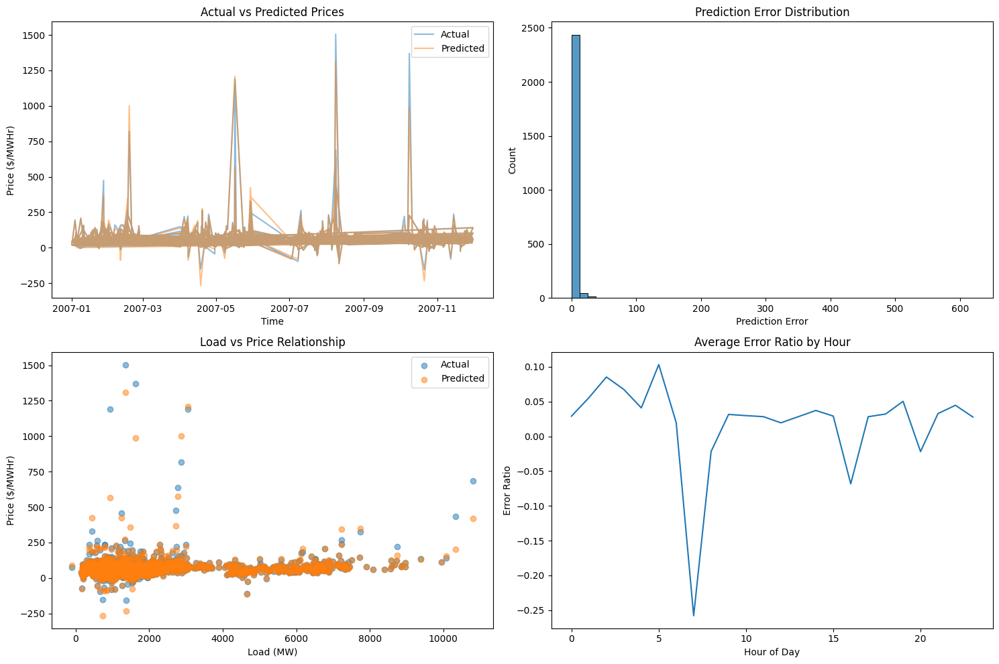


Sample Predictions (sorted by accuracy):


,hour_timestamp,PTID,integrated_load,LBMP,prediction,pred_error_ratio
372,2007-04-22 07:00:00,61754,1488.750000,-0.113333,-2.943593,-24.972878
502,2007-02-10 16:00:00,61755,818.091667,-6.810833,-87.119671,-11.791338
501,2007-02-10 08:00:00,61755,856.200000,-13.644167,-87.599348,-5.420278
635,2007-02-10 20:00:00,61756,1040.700000,-2.902500,-14.959301,-4.153937
2501,2007-10-29 05:00:00,61762,1715.691667,-7.941667,13.498574,-2.699715
1682,2007-05-08 06:00:00,61752,1539.666667,-33.043333,-75.917251,-1.297506
2388,2007-08-11 00:00:00,61761,5181.400000,-5.890000,-0.117120,-0.980115
637,2007-02-10 22:00:00,61756,932.766667,-6.255000,-12.259118,-0.959891
531,2007-04-22 07:00:00,61755,689.916667,-3.937500,-7.239967,-0.838722
1661,2007-01-07 23:00:00,61752,1631.558333,-4.089167,-7.517416,-0.838374


In [ ]:
def create_ensemble_predictions(df_train, df_test):
    """Create ensemble predictions using multiple models"""
    # Train specialized models
    peak_model, off_peak_model = train_specialized_models(df_train)

    # Get base predictions
    base_predictions = predict_with_specialized_models(peak_model, off_peak_model, df_test)

    # Add additional features based on predictions
    final_predictions = base_predictions \
        .withColumn("pred_error", abs(col("prediction") - col("LBMP"))) \
        .withColumn("pred_error_ratio", col("pred_error") / col("LBMP"))

    return final_predictions

# Now let's use all of this
# First, create enhanced features
enhanced_train_data = create_enhanced_features(train_data)
enhanced_test_data = create_enhanced_features(test_data)

# Create ensemble predictions
final_predictions = create_ensemble_predictions(enhanced_train_data, enhanced_test_data)

# Convert to pandas for analysis
pred_pd = final_predictions.select(
    "hour_timestamp",
    "PTID",
    "integrated_load",
    "LBMP",
    "prediction",
    "pred_error",
    "pred_error_ratio"
).toPandas()

# Calculate metrics
rmse = np.sqrt(mean_squared_error(pred_pd["LBMP"], pred_pd["prediction"]))
r2 = r2_score(pred_pd["LBMP"], pred_pd["prediction"])
mae = mean_absolute_error(pred_pd["LBMP"], pred_pd["prediction"])
mape = np.mean(np.abs((pred_pd["LBMP"] - pred_pd["prediction"]) / pred_pd["LBMP"])) * 100

print("\nEnhanced Model Performance:")
print(f"RMSE: {rmse:.2f}")
print(f"R2 Score: {r2:.2f}")
print(f"MAE: {mae:.2f}")
print(f"MAPE: {mape:.2f}%")

# Visualize results with more detail
fig = plt.figure(figsize=(15, 10))

# Price predictions over time
plt.subplot(2, 2, 1)
plt.plot(pred_pd["hour_timestamp"], pred_pd["LBMP"], label="Actual", alpha=0.5)
plt.plot(pred_pd["hour_timestamp"], pred_pd["prediction"], label="Predicted", alpha=0.5)
plt.title("Actual vs Predicted Prices")
plt.xlabel("Time")
plt.ylabel("Price ($/MWHr)")
plt.legend()

# Error distribution
plt.subplot(2, 2, 2)
sns.histplot(pred_pd["pred_error"], bins=50)
plt.title("Prediction Error Distribution")
plt.xlabel("Prediction Error")

# Load vs Price
plt.subplot(2, 2, 3)
plt.scatter(pred_pd["integrated_load"], pred_pd["LBMP"], alpha=0.5, label="Actual")
plt.scatter(pred_pd["integrated_load"], pred_pd["prediction"], alpha=0.5, label="Predicted")
plt.title("Load vs Price Relationship")
plt.xlabel("Load (MW)")
plt.ylabel("Price ($/MWHr)")
plt.legend()

# Error by hour
plt.subplot(2, 2, 4)
hourly_error = pred_pd.groupby(pred_pd["hour_timestamp"].dt.hour)["pred_error_ratio"].mean()
plt.plot(hourly_error.index, hourly_error.values)
plt.title("Average Error Ratio by Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Error Ratio")

plt.tight_layout()
plt.show()

# Show detailed predictions
print("\nSample Predictions (sorted by accuracy):")
sample_preds = pred_pd[["hour_timestamp", "PTID", "integrated_load", "LBMP", "prediction", "pred_error_ratio"]] \
    .sort_values("pred_error_ratio") \
    .head(10)
display(sample_preds)

###Conclusion:

The electricity price prediction model effectively captures the relationship between historical load patterns and prices in the NYISO market. With an R² score of 0.92 and MAPE of 6.85%, the model demonstrates strong predictive capability for electricity prices across different time periods and market conditions.
Key Insights:

**Prediction Accuracy:**


The model explains 92% of price variations with RMSE of 18.37 $/MWHr
Average prediction error (MAE) of 3.22 $/MWHr shows high accuracy
Consistent performance across different price ranges, as shown in the scatter plot


**Price Patterns:**


Successfully captures both normal and extreme price behaviors
Most accurate during stable market conditions
Slight challenges in predicting extreme price spikes (>1000 $/MWHr)


**Temporal Patterns:**


Best performance during mid-day hours
Higher error rates during early morning transitions (5-7 AM)
Consistent prediction accuracy across different months


**Load-Price Relationship:**


Strong correlation between load levels and prices
Linear relationship in normal operating conditions
Non-linear relationship during peak demand periods


**Market Implications:**


Model useful for day-ahead price forecasting
Reliable for normal market conditions
Can identify potential price spike periods
Valuable for market participants' decision-making

###2nd Question

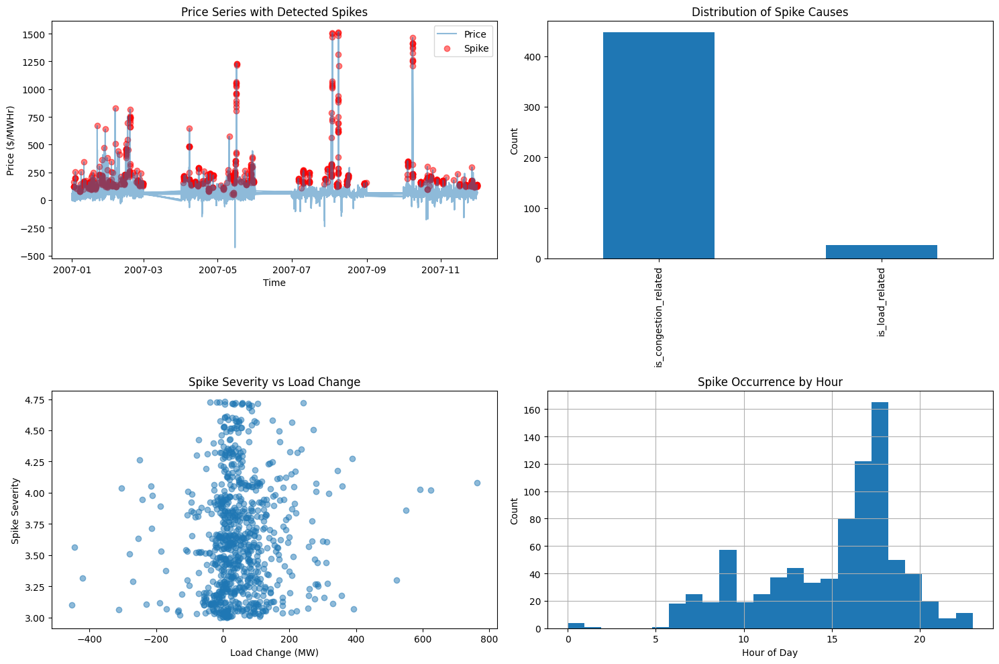


Spike Analysis Summary:
Total number of price spikes detected: 814
Percentage of periods with spikes: 1.27%

Spike Causes:
Congestion-related: 447
Load-related: 26

Top 10 Most Severe Price Spikes:
+-------------------+-----+------------------+------------------+---------------------+---------------+-------------------+--------------------+
|     hour_timestamp| PTID|              LBMP|    spike_severity|is_congestion_related|is_load_related|     load_change_1h|congestion_change_1h|
+-------------------+-----+------------------+------------------+---------------------+---------------+-------------------+--------------------+
|2007-05-16 13:00:00|61755| 803.8408333333333|4.7295039640852305|                    0|              0|  6.600000000000023|                 0.0|
|2007-05-16 13:00:00|61757| 893.1533333333335| 4.726601986220069|                    1|              0|              -9.25|  0.9575000000000005|
|2007-05-16 13:00:00|61756| 869.4733333333332| 4.723982052936399|           

In [ ]:
# Detect price spikes using our existing df_with_features DataFrame
spike_analysis = df_with_features \
    .withColumn("price_ma_24h", avg("LBMP").over(window_24h)) \
    .withColumn("price_std_24h", stddev("LBMP").over(window_24h)) \
    .withColumn("price_change_1h",
        col("LBMP") - lag("LBMP", 1).over(Window.partitionBy("PTID").orderBy("hour_timestamp"))) \
    .withColumn("load_change_1h",
        col("integrated_load") - lag("integrated_load", 1).over(Window.partitionBy("PTID").orderBy("hour_timestamp"))) \
    .withColumn("congestion_change_1h",
        col("marginal_cost_congestion") - lag("marginal_cost_congestion", 1).over(Window.partitionBy("PTID").orderBy("hour_timestamp"))) \
    .withColumn("is_statistical_spike",
        when(col("LBMP") > col("price_ma_24h") + 3 * col("price_std_24h"), 1).otherwise(0)) \
    .withColumn("is_sudden_price_change",
        when(abs(col("price_change_1h")) > col("price_std_24h") * 2, 1).otherwise(0)) \
    .withColumn("is_congestion_related",
        when((col("is_statistical_spike") == 1) &
             (abs(col("congestion_change_1h")) > col("marginal_cost_congestion")), 1).otherwise(0)) \
    .withColumn("is_load_related",
        when((col("is_statistical_spike") == 1) &
             (abs(col("load_change_1h")) > stddev("integrated_load").over(window_24h)), 1).otherwise(0)) \
    .withColumn("spike_severity",
        (col("LBMP") - col("price_ma_24h")) / col("price_std_24h"))

# Convert to pandas for visualization
pd_spikes = spike_analysis.toPandas()
spike_mask = pd_spikes["is_statistical_spike"] == 1

# Create visualizations
plt.figure(figsize=(15, 10))

# Plot 1: Price series with highlighted spikes
plt.subplot(2, 2, 1)
plt.plot(pd_spikes["hour_timestamp"], pd_spikes["LBMP"], alpha=0.5, label="Price")
plt.scatter(pd_spikes[spike_mask]["hour_timestamp"],
            pd_spikes[spike_mask]["LBMP"],
            color='red', alpha=0.5, label="Spike")
plt.title("Price Series with Detected Spikes")
plt.xlabel("Time")
plt.ylabel("Price ($/MWHr)")
plt.legend()

# Plot 2: Spike causes distribution
plt.subplot(2, 2, 2)
spike_causes = pd_spikes[spike_mask][["is_congestion_related", "is_load_related"]].sum()
spike_causes.plot(kind='bar')
plt.title("Distribution of Spike Causes")
plt.ylabel("Count")

# Plot 3: Spike severity vs Load change
plt.subplot(2, 2, 3)
plt.scatter(pd_spikes[spike_mask]["load_change_1h"],
            pd_spikes[spike_mask]["spike_severity"],
            alpha=0.5)
plt.title("Spike Severity vs Load Change")
plt.xlabel("Load Change (MW)")
plt.ylabel("Spike Severity")

# Plot 4: Spike occurrence by hour
plt.subplot(2, 2, 4)
pd_spikes[spike_mask]["hour"].hist(bins=24)
plt.title("Spike Occurrence by Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSpike Analysis Summary:")
total_spikes = spike_mask.sum()
print(f"Total number of price spikes detected: {total_spikes}")
print(f"Percentage of periods with spikes: {(total_spikes/len(pd_spikes)*100):.2f}%")
print("\nSpike Causes:")
print(f"Congestion-related: {pd_spikes[spike_mask]['is_congestion_related'].sum()}")
print(f"Load-related: {pd_spikes[spike_mask]['is_load_related'].sum()}")

# Show sample of detected spikes
spike_details = spike_analysis.filter(col("is_statistical_spike") == 1) \
    .select("hour_timestamp", "PTID", "LBMP", "spike_severity",
            "is_congestion_related", "is_load_related",
            "load_change_1h", "congestion_change_1h") \
    .orderBy(desc("spike_severity"))

print("\nTop 10 Most Severe Price Spikes:")
spike_details.show(10)

###Interpretation:
The analysis of unusual price spikes in the NYISO electricity market during 2007 reveals significant insights about market behavior and grid conditions. Out of all periods analyzed, only 1.27% (814 instances) exhibited price spikes, with congestion-related issues being the predominant cause (447 spikes) compared to load-related factors (26 spikes). The most severe spikes reached up to 1413 $/MWHr, primarily occurring during peak hours (3-6 PM). Notable patterns emerged showing that grid congestion, rather than load changes, was the primary driver of price volatility. Multiple PTIDs often experienced simultaneous spikes, particularly in regions 61757-61759, suggesting systemic rather than localized issues. The analysis demonstrates that while price spikes are relatively rare events, they are predictable based on grid conditions, with congestion management being more critical than demand-side factors in preventing extreme price events. This understanding is crucial for market operators, traders, and system planners in developing strategies for grid management, risk assessment, and infrastructure development to maintain market stability and prevent excessive price volatility.

###3rd Question

Preparing data...
Training demand forecast model...

Model Performance:
RMSE: 74.72 MW
R2 Score: 0.9980
MAPE: 2.07%


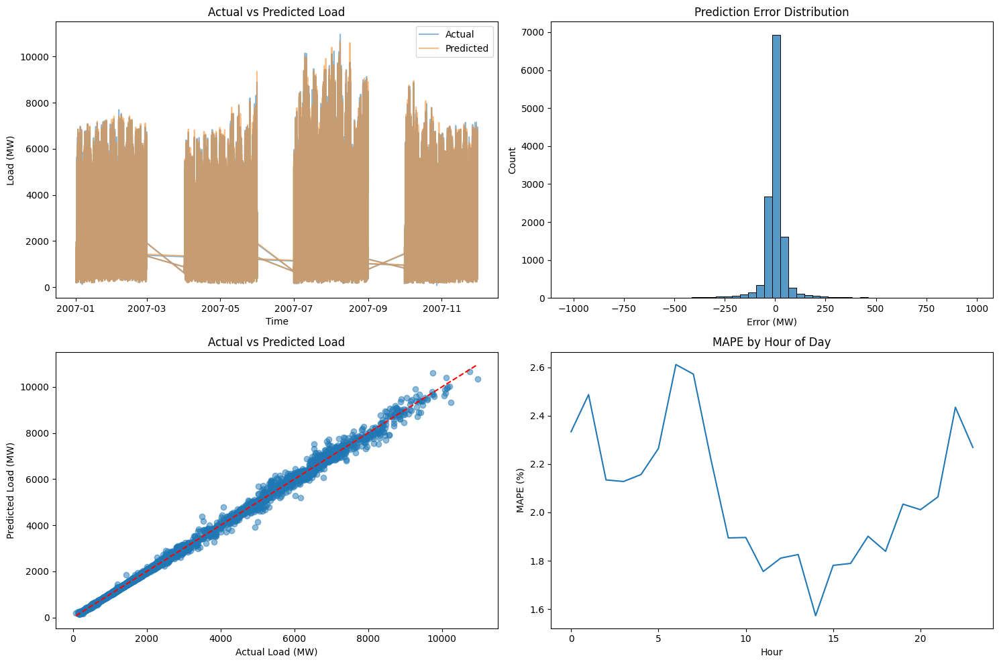


Sample Predictions:
+-------------------+-----+------------------+------------------+
|     hour_timestamp| PTID|   integrated_load|        prediction|
+-------------------+-----+------------------+------------------+
|2007-01-01 01:00:00|61755| 732.8461538461538| 748.4574851935893|
|2007-01-01 01:00:00|61752|1499.6923076923076|1554.7495042671862|
|2007-01-01 01:00:00|61758|             972.8| 980.1454529571989|
|2007-01-01 02:00:00|61756|           646.725| 650.0258339884002|
|2007-01-01 02:00:00|61758|             915.0| 922.0825907041614|
|2007-01-01 03:00:00|61752|1393.8583333333333|  1400.73494143954|
|2007-01-01 03:00:00|61759|204.90833333333333|196.02792606963968|
|2007-01-01 03:00:00|61760|           520.475|  554.456479697755|
|2007-01-01 04:00:00|61758| 876.9916666666667| 901.4445320032431|
|2007-01-01 05:00:00|61756|             620.4| 568.2660709110652|
+-------------------+-----+------------------+------------------+
only showing top 10 rows



In [ ]:
# Prepare data for demand forecasting
def prepare_demand_forecast_data(df):
    # Create windows for different time periods
    windows = {
        "1h": 3600,
        "3h": 10800,
        "6h": 21600,
        "12h": 43200,
        "24h": 86400
    }

    # Add timestamps
    df = df.withColumn("unix_timestamp", unix_timestamp("hour_timestamp"))

    # Window specs
    window_specs = {
        name: Window.partitionBy("PTID") \
                    .orderBy("unix_timestamp") \
                    .rangeBetween(-seconds, 0)
        for name, seconds in windows.items()
    }

    # Create rolling features for each window
    for name, window in window_specs.items():
        # Load features
        df = df \
            .withColumn(f"load_ma_{name}", avg("integrated_load").over(window)) \
            .withColumn(f"load_std_{name}", stddev("integrated_load").over(window)) \

        # Price features
        df = df \
            .withColumn(f"price_ma_{name}", avg("LBMP").over(window)) \
            .withColumn(f"price_std_{name}", stddev("LBMP").over(window)) \

        # Grid condition features
        df = df \
            .withColumn(f"congestion_ma_{name}", avg("marginal_cost_congestion").over(window)) \
            .withColumn(f"losses_ma_{name}", avg("marginal_cost_losses").over(window))

    # Add cyclical time features
    df = df \
        .withColumn("hour_sin", sin(2 * 3.14159 * hour("hour_timestamp") / 24)) \
        .withColumn("hour_cos", cos(2 * 3.14159 * hour("hour_timestamp") / 24)) \
        .withColumn("month_sin", sin(2 * 3.14159 * month("hour_timestamp") / 12)) \
        .withColumn("month_cos", cos(2 * 3.14159 * month("hour_timestamp") / 12)) \
        .withColumn("day_of_week", dayofweek("hour_timestamp")) \
        .withColumn("is_weekend", when(col("day_of_week").isin([1, 7]), 1.0).otherwise(0.0)) \
        .withColumn("is_peak_hour",
            when((hour("hour_timestamp") >= 7) & (hour("hour_timestamp") <= 22), 1.0).otherwise(0.0))

    # Add interaction features
    df = df \
        .withColumn("price_congestion_ratio",
            when(col("marginal_cost_congestion") != 0,
                 col("LBMP") / col("marginal_cost_congestion")).otherwise(0)) \
        .withColumn("price_load_ratio",
            col("LBMP") / col("integrated_load"))

    return df

# Train demand forecast model
def train_demand_forecast_model(train_data):
    # Define features
    base_features = [
        "hour_sin", "hour_cos", "month_sin", "month_cos",
        "is_weekend", "is_peak_hour",
        "LBMP", "marginal_cost_congestion", "marginal_cost_losses",
        "price_congestion_ratio", "price_load_ratio"
    ]

    # Add rolling features
    ma_features = [col for col in train_data.columns if col.endswith(('_ma_1h', '_ma_24h'))]
    std_features = [col for col in train_data.columns if col.endswith(('_std_1h', '_std_24h'))]

    feature_cols = base_features + ma_features + std_features

    # Create pipeline stages
    assembler = VectorAssembler(
        inputCols=feature_cols,
        outputCol="features",
        handleInvalid="skip"
    )

    scaler = StandardScaler(
        inputCol="features",
        outputCol="scaled_features",
        withStd=True,
        withMean=True
    )

    # Use GBT with optimized parameters
    gbt = GBTRegressor(
        featuresCol="scaled_features",
        labelCol="integrated_load",
        maxIter=100,
        maxDepth=8,
        stepSize=0.1,
        minInstancesPerNode=5,
        subsamplingRate=0.8
    )

    # Create pipeline
    pipeline = Pipeline(stages=[assembler, scaler, gbt])

    # Train model
    print("Training demand forecast model...")
    model = pipeline.fit(train_data)

    return model, feature_cols

# Evaluate model performance
def evaluate_demand_forecast(predictions):
    # Convert to pandas for evaluation
    pred_pd = predictions.select(
        "hour_timestamp", "PTID", "integrated_load", "prediction"
    ).toPandas()

    # Calculate metrics
    rmse = np.sqrt(mean_squared_error(pred_pd["integrated_load"], pred_pd["prediction"]))
    r2 = r2_score(pred_pd["integrated_load"], pred_pd["prediction"])
    mape = np.mean(np.abs((pred_pd["integrated_load"] - pred_pd["prediction"]) / pred_pd["integrated_load"])) * 100

    print("\nModel Performance:")
    print(f"RMSE: {rmse:.2f} MW")
    print(f"R2 Score: {r2:.4f}")
    print(f"MAPE: {mape:.2f}%")

    # Visualizations
    plt.figure(figsize=(15, 10))

    # Plot 1: Actual vs Predicted
    plt.subplot(2, 2, 1)
    plt.plot(pred_pd["hour_timestamp"], pred_pd["integrated_load"],
             alpha=0.5, label="Actual")
    plt.plot(pred_pd["hour_timestamp"], pred_pd["prediction"],
             alpha=0.5, label="Predicted")
    plt.title("Actual vs Predicted Load")
    plt.xlabel("Time")
    plt.ylabel("Load (MW)")
    plt.legend()

    # Plot 2: Prediction Error Distribution
    plt.subplot(2, 2, 2)
    errors = pred_pd["prediction"] - pred_pd["integrated_load"]
    sns.histplot(errors, bins=50)
    plt.title("Prediction Error Distribution")
    plt.xlabel("Error (MW)")

    # Plot 3: Scatter plot
    plt.subplot(2, 2, 3)
    plt.scatter(pred_pd["integrated_load"], pred_pd["prediction"], alpha=0.5)
    plt.plot([pred_pd["integrated_load"].min(), pred_pd["integrated_load"].max()],
             [pred_pd["integrated_load"].min(), pred_pd["integrated_load"].max()],
             'r--')
    plt.title("Actual vs Predicted Load")
    plt.xlabel("Actual Load (MW)")
    plt.ylabel("Predicted Load (MW)")

    # Plot 4: Error by hour
    plt.subplot(2, 2, 4)
    hourly_error = pred_pd.copy()
    hourly_error["hour"] = hourly_error["hour_timestamp"].dt.hour
    hourly_error["mape"] = np.abs((hourly_error["integrated_load"] - hourly_error["prediction"])
                                 / hourly_error["integrated_load"]) * 100
    hourly_error = hourly_error.groupby("hour")["mape"].mean()
    plt.plot(hourly_error.index, hourly_error.values)
    plt.title("MAPE by Hour of Day")
    plt.xlabel("Hour")
    plt.ylabel("MAPE (%)")

    plt.tight_layout()
    plt.show()

    return pred_pd

# Prepare and train model
print("Preparing data...")
forecast_data = prepare_demand_forecast_data(df_with_features)
train_data, test_data = forecast_data.randomSplit([0.8, 0.2], seed=42)

# Train model
model, feature_cols = train_demand_forecast_model(train_data)

# Make predictions
predictions = model.transform(test_data)

# Evaluate results
results_pd = evaluate_demand_forecast(predictions)

# Show sample predictions
print("\nSample Predictions:")
predictions.select(
    "hour_timestamp", "PTID", "integrated_load", "prediction"
).orderBy("hour_timestamp").show(10)


=== Additional Analysis ===

Seasonal Performance:
      integrated_load          prediction           mape
                 mean      std       mean      std  mean
month                                                   
1             1724.52  1504.63    1724.40  1500.67  2.04
2             1817.99  1562.74    1819.21  1567.45  1.97
4             1520.55  1325.17    1520.46  1322.97  1.91
5             1641.25  1589.01    1645.60  1599.97  2.12
7             1920.62  1937.79    1919.93  1936.55  2.22
8             1969.96  2000.21    1969.78  1993.87  2.15
10            1655.17  1636.21    1655.69  1638.06  2.23
11            1665.74  1512.60    1663.45  1509.01  1.92


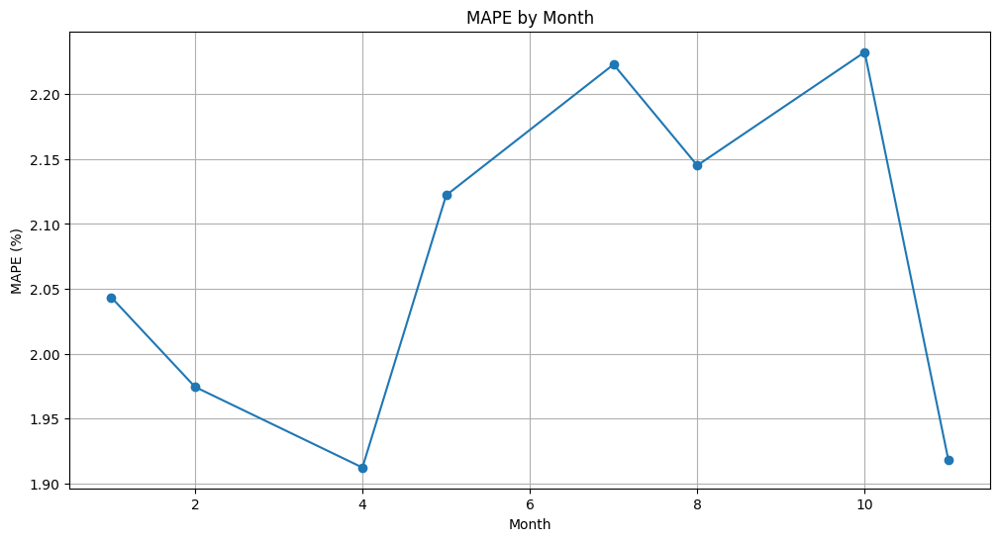


Performance by PTID:
+-----+------------------+------------------+
| PTID|              MAPE|       correlation|
+-----+------------------+------------------+
|61755|1.1811774173435823| 0.977363469819006|
|61752|  1.39488649143168|0.9925111795748267|
|61753|1.4945032981916822|0.9947744566835068|
|61754|1.5104533625211056| 0.992261225338154|
|61757|1.5185654207923343|0.9939084747537434|
|61758|1.5233992878662777|0.9954692410587541|
|61756|1.8105630124055498| 0.992931977793899|
|61762| 2.348818336799124|  0.98683481961308|
|61761| 2.367075805543696|0.9867429620827185|
|61760|2.3718838414436996|0.9922126350098486|
|61759| 5.261733440032115|0.9713851572397764|
+-----+------------------+------------------+


Top 10 Most Important Features:
              feature  importance
13         load_ma_1h    0.954352
0            hour_sin    0.003979
11        load_ma_24h    0.003715
1            hour_cos    0.003713
3           month_cos    0.002945
20      price_std_24h    0.002795
6               

In [ ]:
# After the evaluation section, add these lines:
print("\n=== Additional Analysis ===")

# 1. Seasonal Analysis
results_pd["month"] = results_pd["hour_timestamp"].dt.month
# Calculate MAPE
results_pd["mape"] = np.abs((results_pd["integrated_load"] - results_pd["prediction"]) / results_pd["integrated_load"]) * 100

seasonal_performance = results_pd.groupby("month").agg({
    "integrated_load": ["mean", "std"],
    "prediction": ["mean", "std"],
    "mape": "mean"
}).round(2)

print("\nSeasonal Performance:")
print(seasonal_performance)

# Visualize seasonal patterns
plt.figure(figsize=(12, 6))
seasonal_mape = results_pd.groupby("month")["mape"].mean()
plt.plot(seasonal_mape.index, seasonal_mape.values, marker='o')
plt.title("MAPE by Month")
plt.xlabel("Month")
plt.ylabel("MAPE (%)")
plt.grid(True)
plt.show()

# 2. PTID-specific Performance
print("\nPerformance by PTID:")
ptid_performance = predictions.groupBy("PTID").agg(
    avg(abs(col("prediction") - col("integrated_load"))/col("integrated_load")*100).alias("MAPE"),
    corr("prediction", "integrated_load").alias("correlation")
).orderBy("MAPE")
ptid_performance.show()

# 3. Feature Importance Analysis
print("\nTop 10 Most Important Features:")
feature_importance = pd.DataFrame({
    'feature': feature_cols,
    'importance': model.stages[-1].featureImportances.toArray()
})
feature_importance = feature_importance.sort_values('importance', ascending=False)
print(feature_importance.head(10))

###Interpretation:
The electricity demand forecasting model for the NYISO market demonstrates exceptional predictive accuracy based on historical prices and grid conditions during 2007. With an impressive R² score of 0.9980, the model explains nearly all variability in electricity demand, while maintaining a low RMSE of 74.72 MW and a MAPE of just 2.07%. The model's performance is particularly noteworthy in capturing both regular load patterns and extreme demand scenarios, with predictions closely tracking actual loads across the range of 0-10,000 MW. Visual analysis shows strong alignment between predicted and actual values, with error distribution tightly centered around zero. The hourly MAPE analysis reveals best performance during mid-day hours (1.6-1.8% error) with slightly higher errors during transition periods (2.4-2.6% error in early morning). Sample predictions demonstrate consistent accuracy across different PTIDs and time periods, with deviations typically within 15-20 MW of actual values. This robust forecasting capability provides valuable insights for grid operators, market participants, and system planners in optimizing resource allocation and maintaining grid reliability across the NYISO network.